In [1]:
import rasterio as rio
from rasterio.mask import mask
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gp
import re
from tqdm import tqdm
import os
import cv2
from datetime import datetime, timedelta
from sklearn.metrics import r2_score
from scipy.interpolate import UnivariateSpline
from scipy.spatial import ConvexHull
import seaborn as sns
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import pathlib
import zipfile
import random
from PIL import Image
import joblib

In [2]:
%cd /scratch/user/anshulya
%ls

/scratch/user/anshulya
383_LAKE_MEAD.tif                hls_data/
487/                             hls_job1.sh
800_res.geojson                  hls_job2.sh
DAACDataDownload.py              hls_job3.sh
LAKE_MEAD_dem.tif                hls_job4.sh
PIP_CACHE/                       in-situ_data.csv
WT_432.geojson                   jrc_data/
area_estimation_driver.sh*       jupyter_notebooks/
area_job1.sh                     lake_rf_new.pkl
blitz_script_1.sh*               lake_rf_new_L30.pkl
blitz_script_2.sh*               log_files/
blitz_script_3.sh*               max_117.csv
blitz_script_4.sh*               max_232.csv
blitz_script_5.sh*               max_264.csv
blitz_script_6.sh*               max_265.csv
clipped_data_creation.py         max_267.csv
clipped_raster.tif               max_352.csv
compare_stats.py                 max_362.csv
cubesat_data/                    max_371.csv
cubesat_rf.pkl                   max_394.csv
delete_folders.sh*               max_406.csv
estimate_area

In [3]:
def preprocess_reservoir_shp(fname):
  reservoirs = gp.read_file(fname)

  reservoirs.loc[107,'name'] = 'Farmer_s Creek Reservoir'

  t = ['/' in s for s in reservoirs['name']]
  i = 0
  res_names = ['Cox Lake', 'Eagle Nest Lake_Manor Lake', 'Lake Ballinger_Lake Moonen', 'Lake Olney_Lake Cooper', 'Mustang Lake']
  for res_idx in [77, 93, 183, 249, 313]:
    reservoirs.loc[res_idx, 'name'] = res_names[i]
    i = i + 1

  i = 0
  res_names = ['Lake Gonzales','Clear Lake Wa']
  for res_idx in [218, 70]:
    reservoirs.loc[res_idx, 'name'] = res_names[i]
    i = i + 1

  for i in range(809):
    string = reservoirs.loc[i, 'name']
    regex = re.compile('[@!#$%^&*()<>?/\|}{~]')
    # Pass the string in search
    # method of regex object.
    if(regex.search(string) == None):
      continue
    else:
      print(i,string)

  return reservoirs

In [4]:
## Get reservoir shapefile and geometry
fname = '800_res.geojson'
reservoirs = preprocess_reservoir_shp(fname)
for idx, row in reservoirs.iterrows():
    lat = row['geometry'].centroid.y
    area = row['geometry'].area*111*111*np.cos(lat/180*np.pi)
    reservoirs.loc[idx,'area'] = area

In [5]:
res_indices = [1,104,110,14,148,212,273,296,317,89]
res_names = ['agate','enders','flatiron','avalon','huntington','estes','waha','marys','newton','donner']

In [6]:
# Mapping function: maps value from one range to another
def map_value(value, from_min, from_max, to_min, to_max):
    # Convert the value from the original range to the target range
    return (value - from_min) / (from_max - from_min) * (to_max - to_min) + to_min

def scale_channel(array):
  return (array - np.min(array)) * (255 / (np.max(array) - np.min(array)))

In [7]:
files = [f for f in os.listdir(os.path.join('cubesat_data','train_data','labels'))]
print(len(files))

40


In [8]:
# Lists to hold the sorted filenames
land = []
water = []

# Iterate through each filename and sort them
for filename in files:
    if '_land' in filename:
        land.append(filename)
    else:
        water.append(filename)

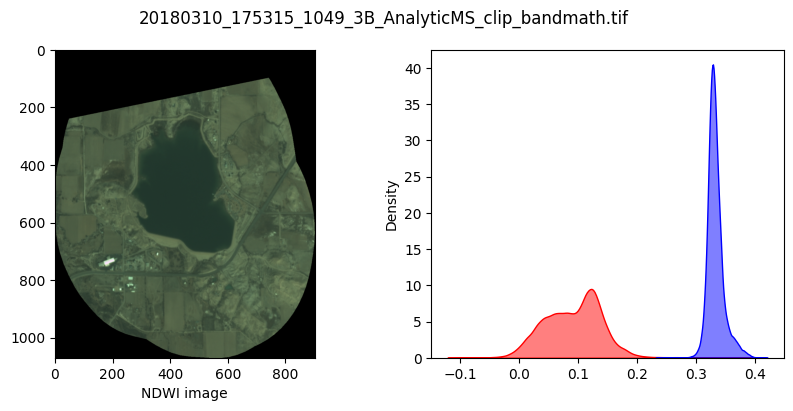

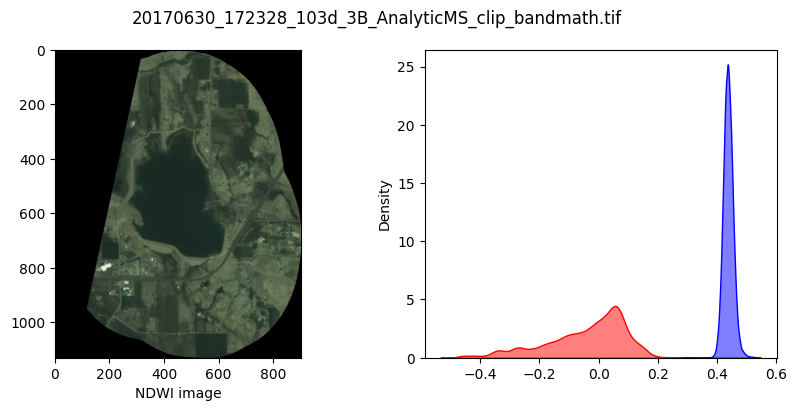

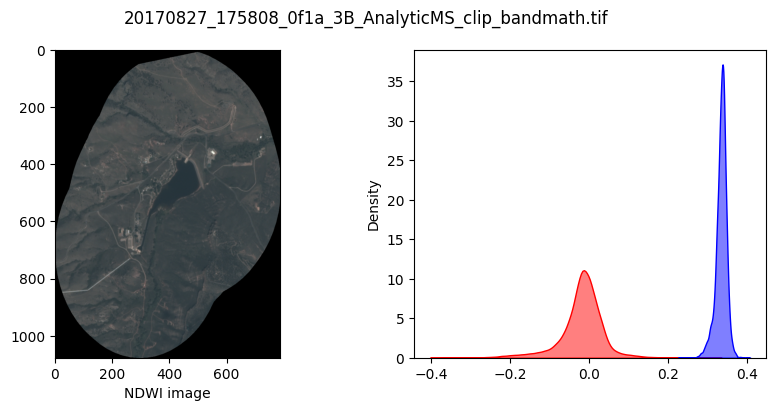

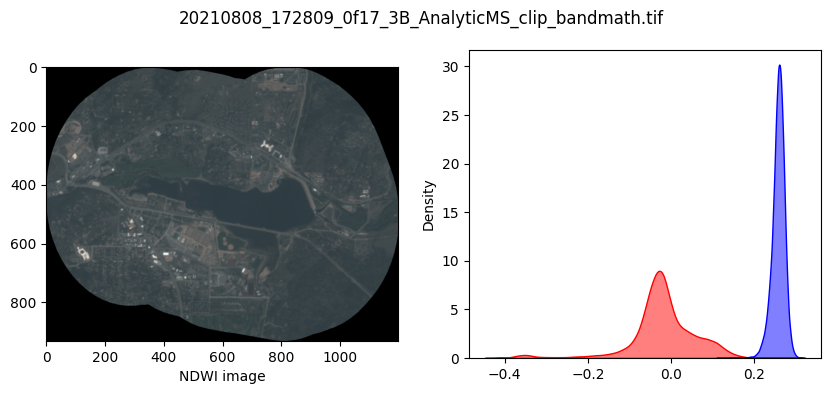

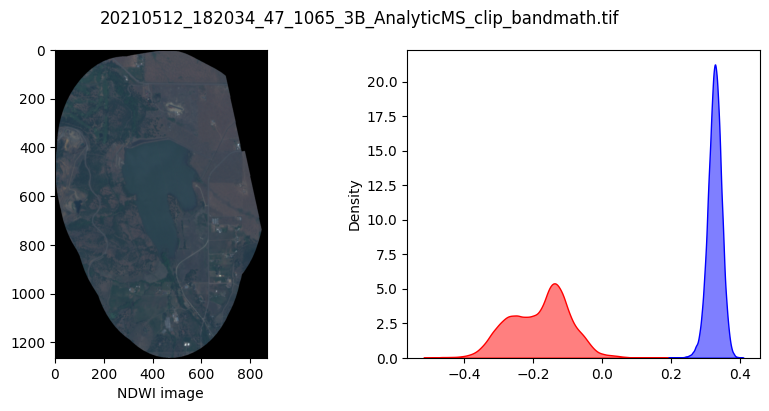

...

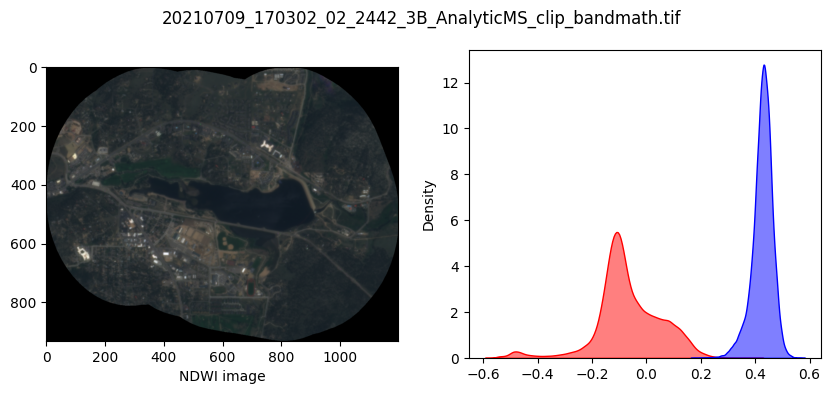

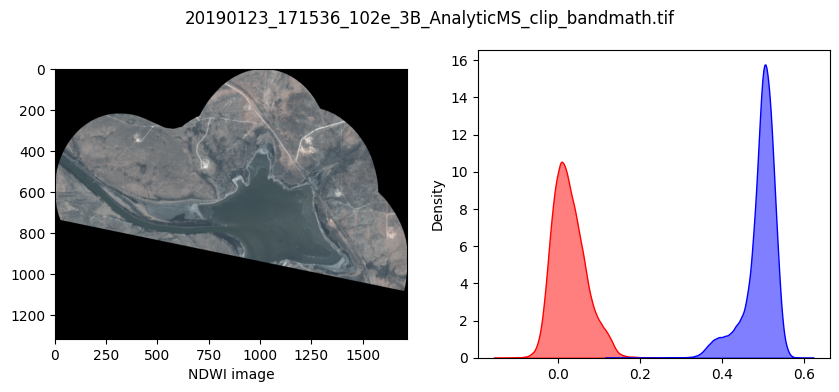

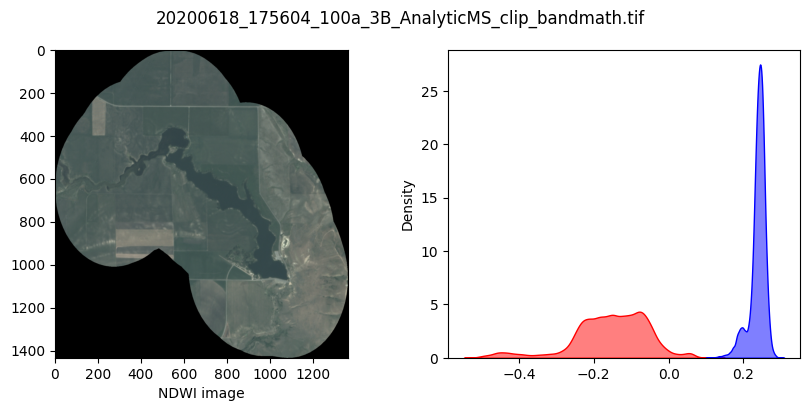

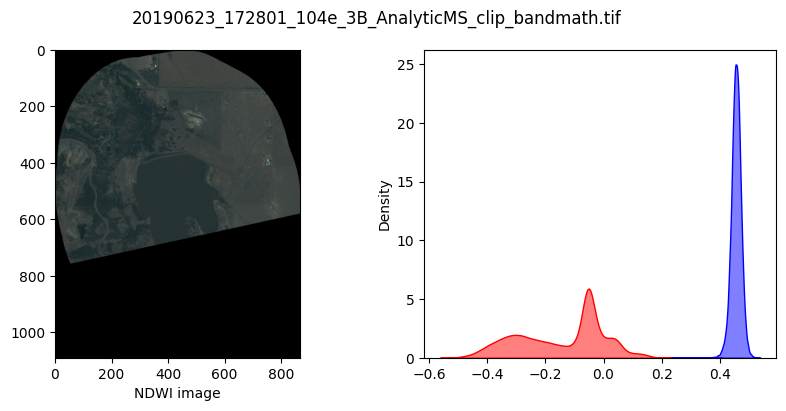

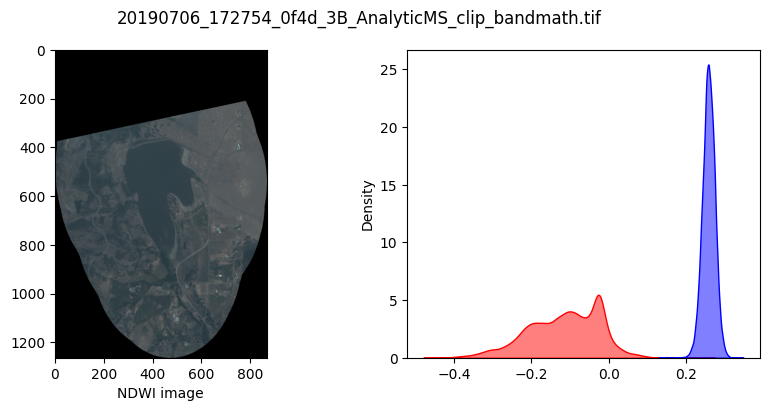

In [9]:
for l in land:
    
    f, _, _ = l.rpartition('_')
    l_mask = np.load(os.path.join('cubesat_data','train_data','labels',f+'_land.npy'))
    w_mask = np.load(os.path.join('cubesat_data','train_data','labels',f+'_water.npy'))

    l_mask[l_mask>0] = 255
    l_mask = l_mask/255

    w_mask[w_mask>0] = 255
    w_mask = w_mask/255
    
    res_name, _, f = f.partition('_')
    f = f+'.tif'

    R = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(1).astype('float')*0.0001
    R[R==-9999*0.0001] = 1
    R = scale_channel(R).astype(np.uint8)
    
    G = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(2).astype('float')*0.0001
    G[G==-9999*0.0001] = 1
    G = scale_channel(G).astype(np.uint8)
    
    B = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(3).astype('float')*0.0001
    B[B==-9999*0.0001] = 1
    B = scale_channel(B).astype(np.uint8)
    

    nir = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(4)*0.0001
    nir = scale_channel(nir).astype(np.uint8)
    
    ras = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(5)

    if ras[ras==0].shape[0]/ras.flatten().shape[0]>0.5:
        continue

    ras_normalized = cv2.normalize(ras, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    ras_flatten_normalized = ras_normalized.flatten()
    
    # Calculate Otsu's threshold on the normalized and flattened array
    otsu_threshold_normalized, _ = cv2.threshold(ras_flatten_normalized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    otsu_threshold_scaled = map_value(otsu_threshold_normalized, 0, 255, ras.min(), ras.max())

    d = datetime.strptime(f.split('_')[0],'%Y%m%d').month

    im = np.dstack((B, G, R))

    fig,ax = plt.subplots(1,2,figsize=(10,4))
    ax[0].imshow(im)
    ax[0].set_xlabel('NDWI image')

    sns.kdeplot(ras[l_mask == 1], ax=ax[1], fill=True, color="red", alpha=0.5, label='L Mask')
    sns.kdeplot(ras[w_mask == 1], ax=ax[1], fill=True, color="blue", alpha=0.5, label='W Mask')

    

    plt.suptitle(f)
    
    plt.show()   

### Make training data

In [28]:
training_bands = ['B', 'G', 'R', 'NIR', 'NDWI'] #PlanetScope
masks = ['land','water']
mask_dict = {'land':0,'water':1}

In [31]:
mflag = 1
for l in tqdm(land):
    
    f, _, _ = l.rpartition('_')
    l_mask = np.load(os.path.join('cubesat_data','train_data','labels',f+'_land.npy'))
    w_mask = np.load(os.path.join('cubesat_data','train_data','labels',f+'_water.npy'))

    l_mask[l_mask>0] = 255
    l_mask = l_mask/255

    w_mask[w_mask>0] = 255
    w_mask = w_mask/255
    
    res_name, _, f = f.partition('_')
    f = f+'.tif'

    flag = 1
    for i in range(1,6):
        if i!=5:
            X = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(i).astype('float')*0.0001
        if flag:
            im = X
            flag = 0
        else:
            im = np.dstack((im, np.array(X)))

    if mflag:
        df = pd.DataFrame(data=im[(l_mask==1),:],columns = training_bands)
        df['class'] = 0
        mflag =0
    else:
        df_ = pd.DataFrame(data=im[(l_mask==1),:],columns = training_bands)
        df_['class'] = 0
        df = pd.concat([df,df_],ignore_index=True)

    df_ = pd.DataFrame(data=im[(w_mask==1),:],columns = training_bands)
    df_['class'] = 1
    df = pd.concat([df,df_],ignore_index=True)

100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


In [32]:
df

,B,G,R,NIR,NDWI,class
0,0.7523,0.7701,0.7754,0.6148,0.6148,0
1,0.7794,0.7802,0.7768,0.6124,0.6124,0
2,0.7395,0.7507,0.7457,0.6123,0.6123,0
3,0.7456,0.7595,0.7539,0.6151,0.6151,0
4,0.7834,0.7886,0.7877,0.6189,0.6189,0
...,...,...,...,...,...,...
9382244,0.4130,0.3704,0.3187,0.2168,0.2168,1
9382245,0.4059,0.3629,0.3117,0.2182,0.2182,1
9382246,0.3982,0.3572,0.2997,0.2244,0.2244,1
9382247,0.4027,0.3647,0.3072,0.2198,0.2198,1


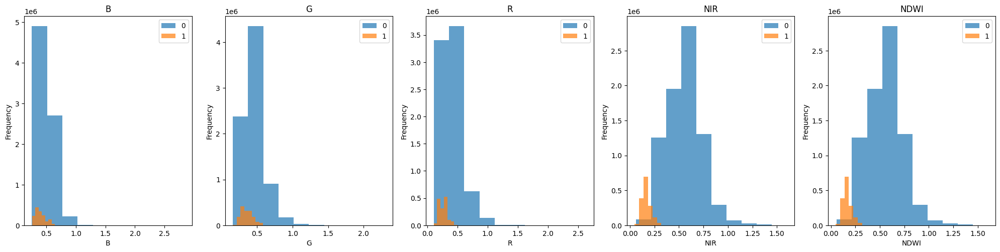

In [35]:
unique_classes = df['class'].unique()
features = [col for col in df.columns if col != 'class']

fig, axes = plt.subplots(1, 5, figsize=(20, 5))
# fig.suptitle('Histograms of Features by Class')

for ax, feature in zip(axes.ravel(), features):
    for cls in unique_classes:
        subset = df[df['class'] == cls]
        ax.hist(subset[feature], label=cls, alpha=0.7)
    ax.set_title(feature)
    ax.set_xlabel(feature)
    ax.set_ylabel('Frequency')
    ax.legend()

plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Adjust the top space so the title doesn't overlap
plt.show()

In [46]:
alpha = [0.0016, 0.01]
for i in range(2):
  class_df = df[df['class']==i]
  sample_class_df = class_df.sample(n=int(class_df.size*alpha[i]),replace=True)
  print('Class {} dataframe with size {} selected'.format(i,sample_class_df.size))

  if flag == 0:
    sample_df = sample_class_df
    flag = 1
  else:
    sample_df = pd.concat([sample_df, sample_class_df])

Class 0 dataframe with size 452208 selected
Class 1 dataframe with size 551274 selected


In [47]:
sample_df = sample_df.dropna()
# Rearrange so that 'class' is the last column
cols = [col for col in df if col != 'class'] + ['class']
sample_df = sample_df[cols]

In [48]:
sample_df.size

49336626

In [49]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

In [50]:
# Separate input variables (X) and target class (y)
X = sample_df.iloc[:, :-1]  # All columns except the last one
y = sample_df.iloc[:, -1]   # Last column

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

t1 = datetime.now()

# Create the Random Forest classifier
clf = RandomForestClassifier()  # You can specify parameters here if needed, otherwise it will use defaults
clf.fit(X_train, y_train)

print('Time taken for training : {}'.format(datetime.now()-t1))

# Evaluate the classifier on the test set
accuracy = clf.score(X_test, y_test)
print("Accuracy:", accuracy)

Time taken for training : 0:17:00.394220
Accuracy: 0.9998619687392638


In [51]:
# Make predictions on the test set
y_pred = clf.predict(X_test)

# Calculate class-wise accuracy
class_report = classification_report(y_test, y_pred)
print("Class-wise Accuracy:\n", class_report)

Class-wise Accuracy:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00   1258094
           1       1.00      1.00      1.00    386461

    accuracy                           1.00   1644555
   macro avg       1.00      1.00      1.00   1644555
weighted avg       1.00      1.00      1.00   1644555



In [52]:
# Get the variable importances
importances = clf.feature_importances_

# Create a DataFrame to display the importances
importance_df = pd.DataFrame({'Variable': X.columns, 'Importance': importances})
importance_df = importance_df.sort_values('Importance', ascending=False)

# Display the variable importances
print(importance_df)

  Variable  Importance
3      NIR    0.479375
4     NDWI    0.352831
2        R    0.065257
1        G    0.057427
0        B    0.045110


In [61]:
#Save the model to a file
joblib.dump(clf, 'cubesat_rf.pkl')

['cubesat_rf.pkl']

In [60]:
files = [f for f in os.listdir(os.path.join('cubesat_data',res_name,'data','files')) if '_clip_bandmath' in f]

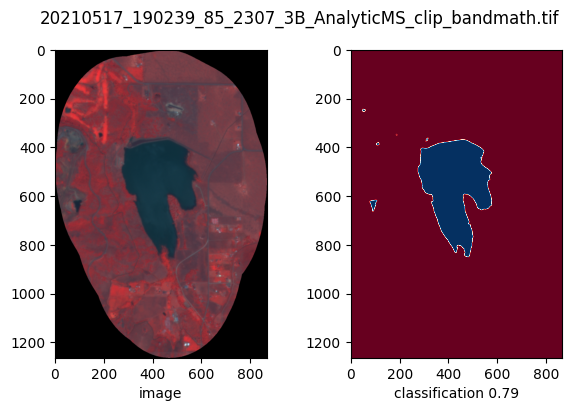

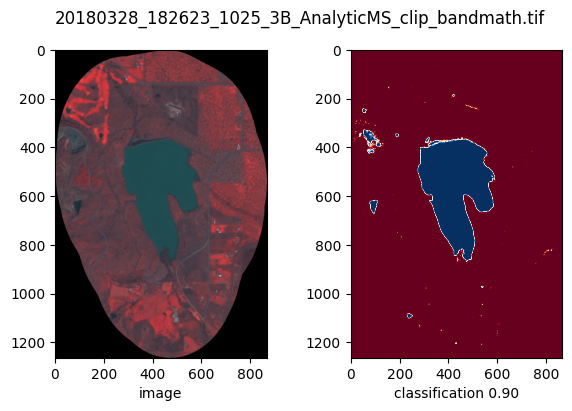

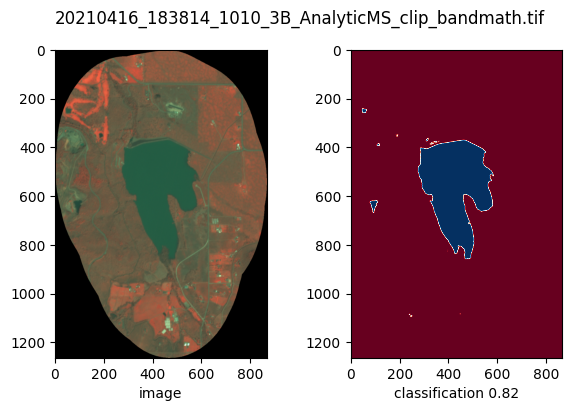

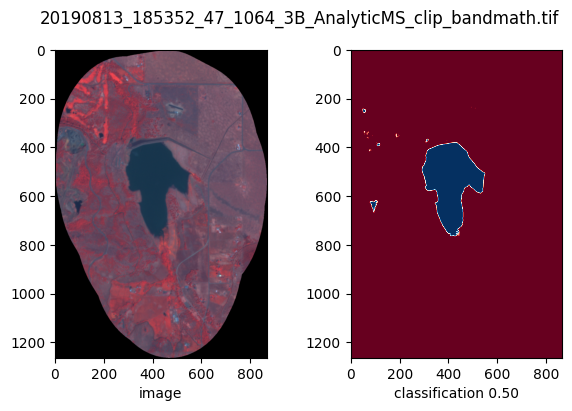

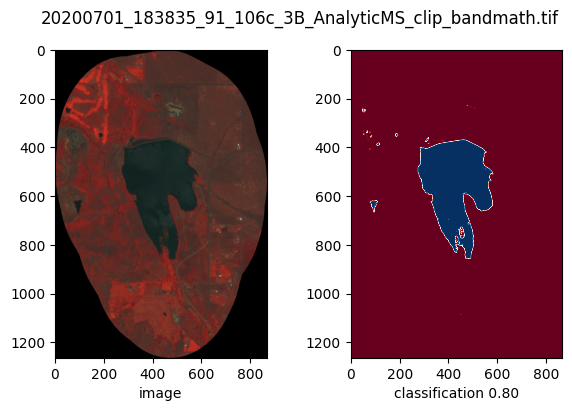

...

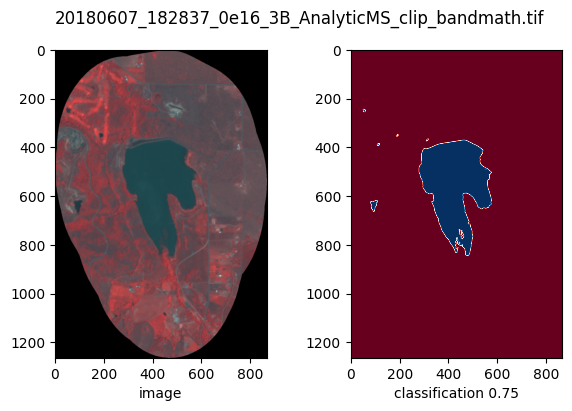

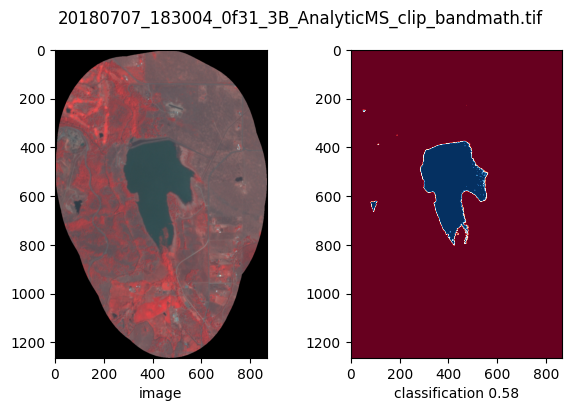

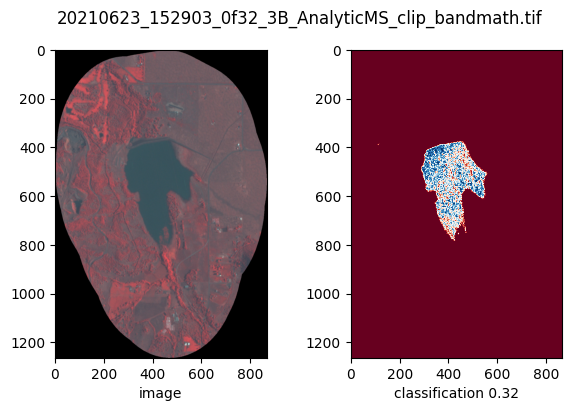

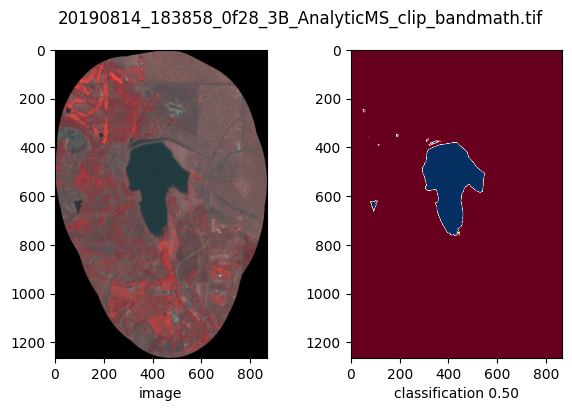

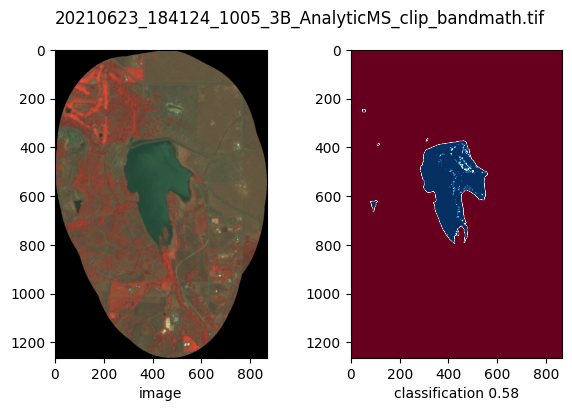

In [ ]:
res_name = 'agate'
for f in files:
    
    # f, _, _ = l.rpartition('_')   
    # res_name, _, f = f.partition('_')
    # f = f+'.tif'

    flag = 1
    for i in range(1,6):
        if i!=5:
            X = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(i).astype('float')*0.0001
        if flag:
            im = X
            flag = 0
        else:
            im = np.dstack((im, np.array(X)))

    test_df = pd.DataFrame(im.reshape((-1, im.shape[-1])), columns=training_bands)

    X_pred = test_df

    predictions = clf.predict(X_pred)

    final_img = np.array(predictions.reshape(im.shape[:2])).astype('int')

    R = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(1).astype('float')*0.0001
    R[R==-9999*0.0001] = 1
    R = scale_channel(R).astype(np.uint8)
    
    G = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(2).astype('float')*0.0001
    G[G==-9999*0.0001] = 1
    G = scale_channel(G).astype(np.uint8)
    
    B = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(3).astype('float')*0.0001
    B[B==-9999*0.0001] = 1
    B = scale_channel(B).astype(np.uint8)
    

    nir = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(4)*0.0001
    nir = scale_channel(nir).astype(np.uint8)
    
    ras = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(5)

    if ras[ras==0].shape[0]/ras.flatten().shape[0]>0.5:
        continue

    ras_normalized = cv2.normalize(ras, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    ras_flatten_normalized = ras_normalized.flatten()

    d = datetime.strptime(f.split('_')[0],'%Y%m%d').month

    im = np.dstack((nir, G, R))

    fig,ax = plt.subplots(1,2,figsize=(7,4))
    ax[0].imshow(im)
    ax[0].set_xlabel('image')
    ax[1].imshow(final_img, cmap='RdBu')
    ax[1].set_xlabel('classification ' + '{:.2f}'.format(final_img[(final_img==1)].shape[0]*9/10**6) )
    plt.suptitle(f)
    
    plt.show()   

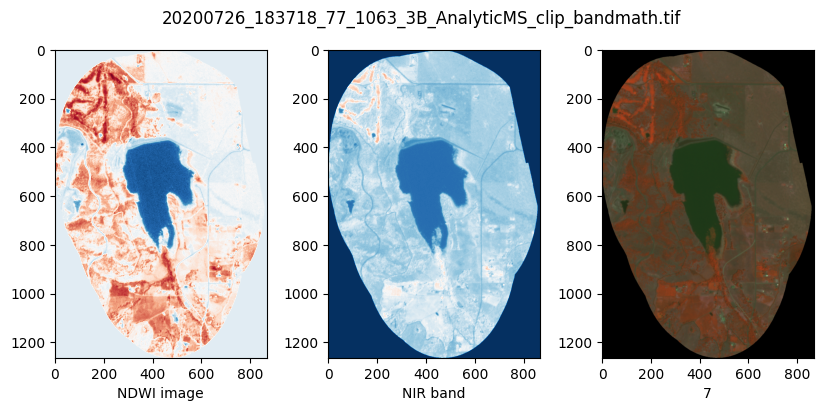

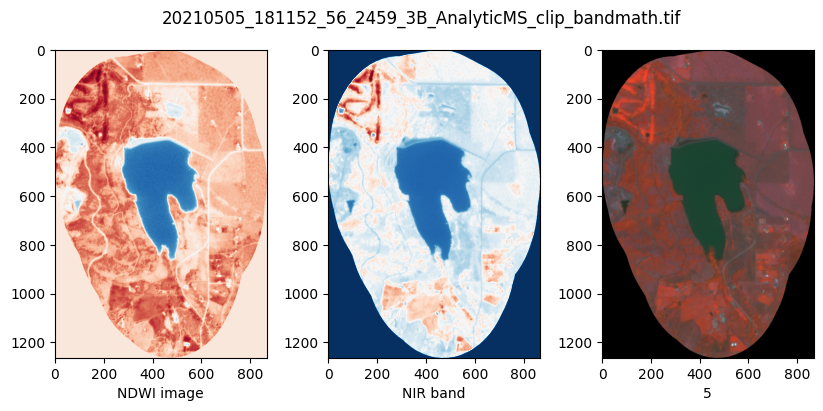

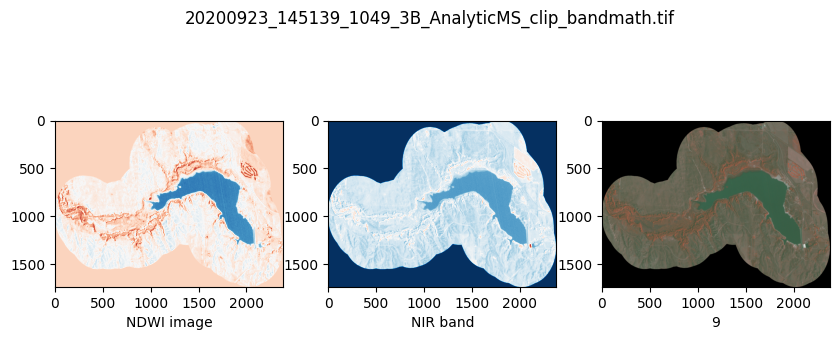

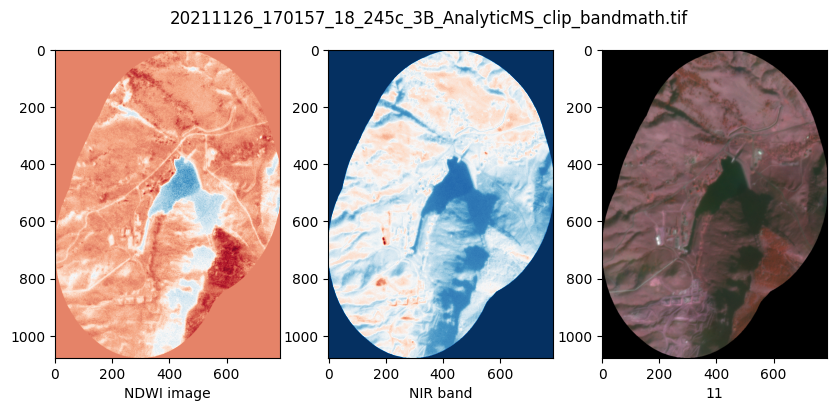

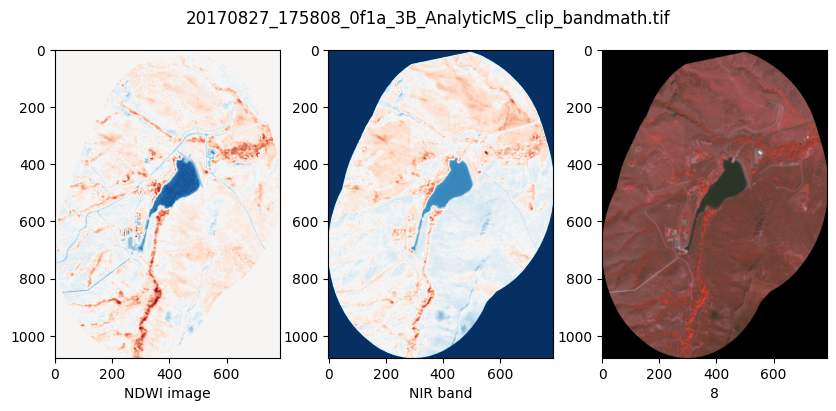

...

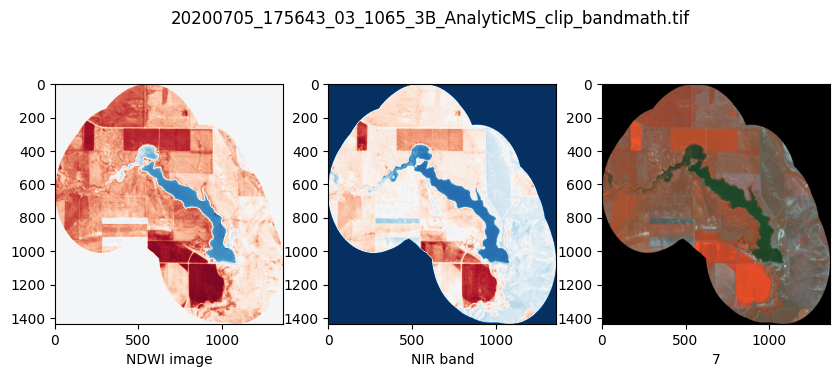

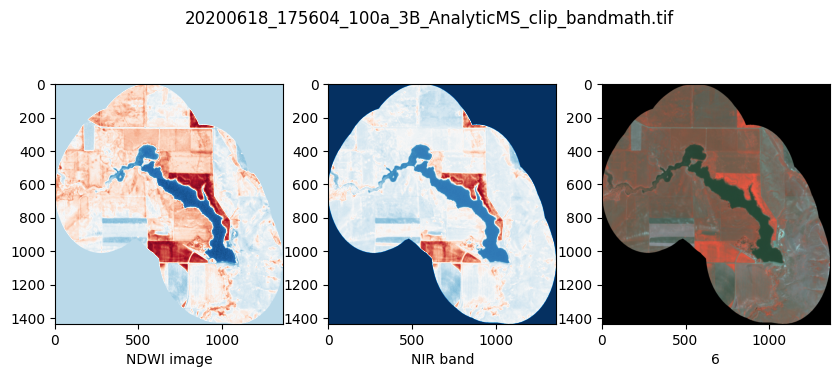

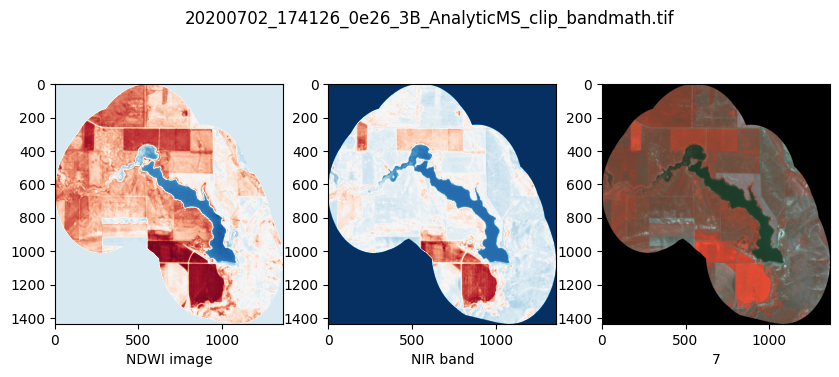

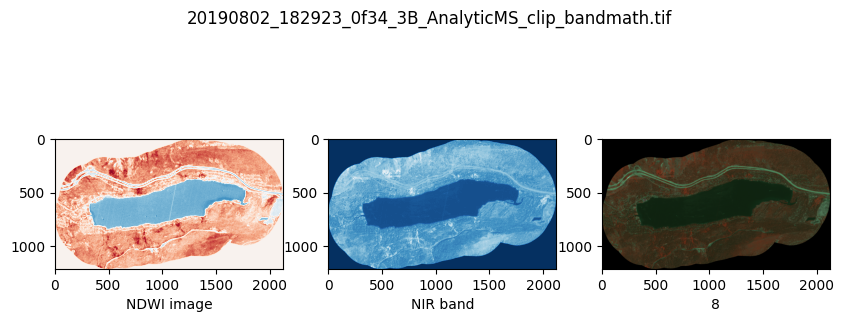

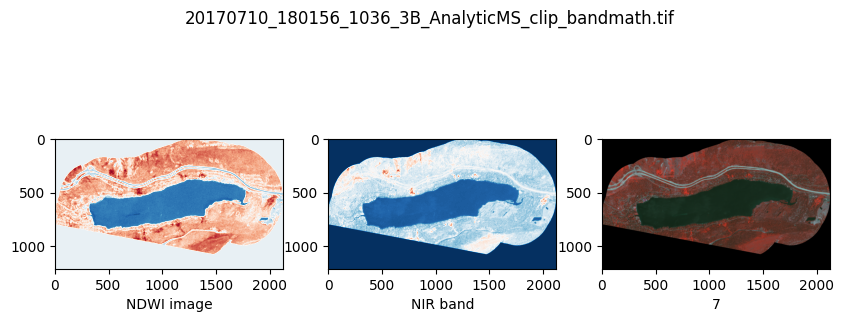

In [20]:
for i in range(10):
    res_idx = res_indices[i]
    res_name = res_names[i]

    files = [f for f in os.listdir(os.path.join('cubesat_data',res_name,'data','files')) if '_clip_bandmath' in f]

    sample_files = random.sample(files, 3) if len(files) >= 3 else files

    for f in sample_files:

        R = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(1).astype('float')*0.0001
        R[R==-9999*0.0001] = 1
        R = scale_channel(R).astype(np.uint8)
        
        G = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(2).astype('float')*0.0001
        G[G==-9999*0.0001] = 1
        G = scale_channel(G).astype(np.uint8)
        
        B = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(3).astype('float')*0.0001
        B[B==-9999*0.0001] = 1
        B = scale_channel(B).astype(np.uint8)
        

        nir = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(4)*0.0001
        nir = scale_channel(nir).astype(np.uint8)
        
        ras = rio.open(os.path.join('cubesat_data',res_name,'data','files',f)).read(5)

        if ras[ras==0].shape[0]/ras.flatten().shape[0]>0.5:
            continue
    
        ras_normalized = cv2.normalize(ras, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
        ras_flatten_normalized = ras_normalized.flatten()
        
        # Calculate Otsu's threshold on the normalized and flattened array
        otsu_threshold_normalized, _ = cv2.threshold(ras_flatten_normalized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        otsu_threshold_scaled = map_value(otsu_threshold_normalized, 0, 255, ras.min(), ras.max())

        d = datetime.strptime(f.split('_')[0],'%Y%m%d').month

        im = np.dstack((nir, G, B))
    
        fig,ax = plt.subplots(1,3,figsize=(10,4))
        ax[0].imshow(ras, cmap='RdBu')
        ax[0].set_xlabel('NDWI image')

        ax[1].imshow(nir, cmap='RdBu_r')
        ax[1].set_xlabel('NIR band')
    
        ax[2].imshow(im)
        ax[2].set_xlabel(d)

        plt.suptitle(f)
        
        plt.show()   

        image = Image.fromarray(im)
        image.save(os.path.join('cubesat_data','train_data',res_name+'_'+f+'.png'))